# Analysing SIFT Matching Points
We will analyse the SIFT Matching Points with different parameters and conditions. Once found the best parameters and conditions we will put then in a systematic way to generate results for all images in the database.

### 1. Load libraries and models configured in the database

In [1]:
%load_ext autoreload
%autoreload 2

import cv2 
import matplotlib.pyplot as plt
import numpy as np
from cv2 import cv2

import ModelsConfiguration as config

models = config.GetModelsConfigured()

## 2. Analysing parameters

#### 2.1 Brute Force Matches Without Crosscheck

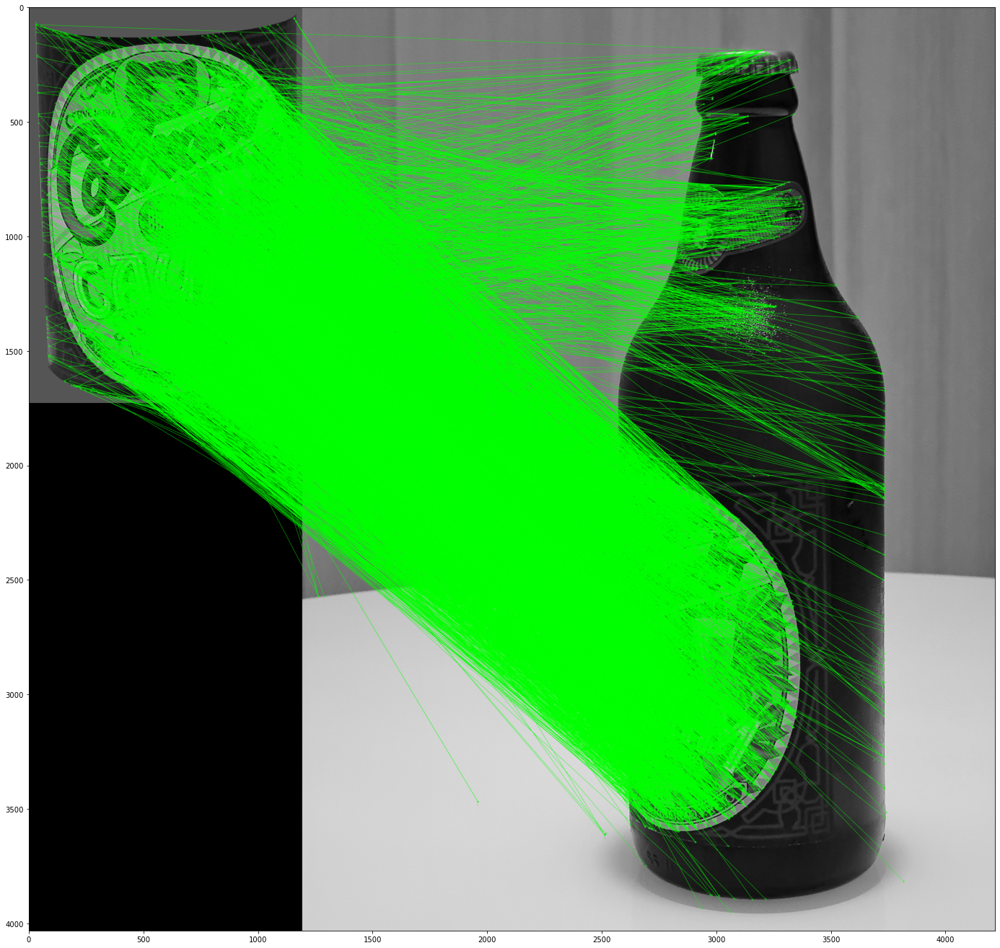

In [2]:
p_TwoSidesCheck = False

# read images
label = cv2.imread('.\\images\\Models\\' + models[0]['Name'] + '\\' + models[0]['Label']['Images'][0])
img_scene = cv2.imread('.\\images\\Models\\' + models[0]['Name'] + '\\OK\\' +  models[0]['OK']['Images'][1])

label = cv2.cvtColor(label, cv2.COLOR_BGR2GRAY)
img_scene = cv2.cvtColor(img_scene, cv2.COLOR_BGR2GRAY)

#sift
sift = cv2.SIFT_create()

keypoints_label, descriptors_label = sift.detectAndCompute(label, None)
keypoints_scene, descriptors_scene = sift.detectAndCompute(img_scene, None)

#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=p_TwoSidesCheck)

matches = bf.match(descriptors_label, descriptors_scene)
matches_without_cc = sorted(matches, key = lambda x:x.distance)

img_result = cv2.drawMatches(label, keypoints_label, img_scene, keypoints_scene, 
                             matches_without_cc, img_scene, flags=2, matchColor=(0, 255, 0))
plt.figure(figsize=[24,24])
plt.imshow(img_result)

#### 2.2 Brute Force Matches With Crosscheck

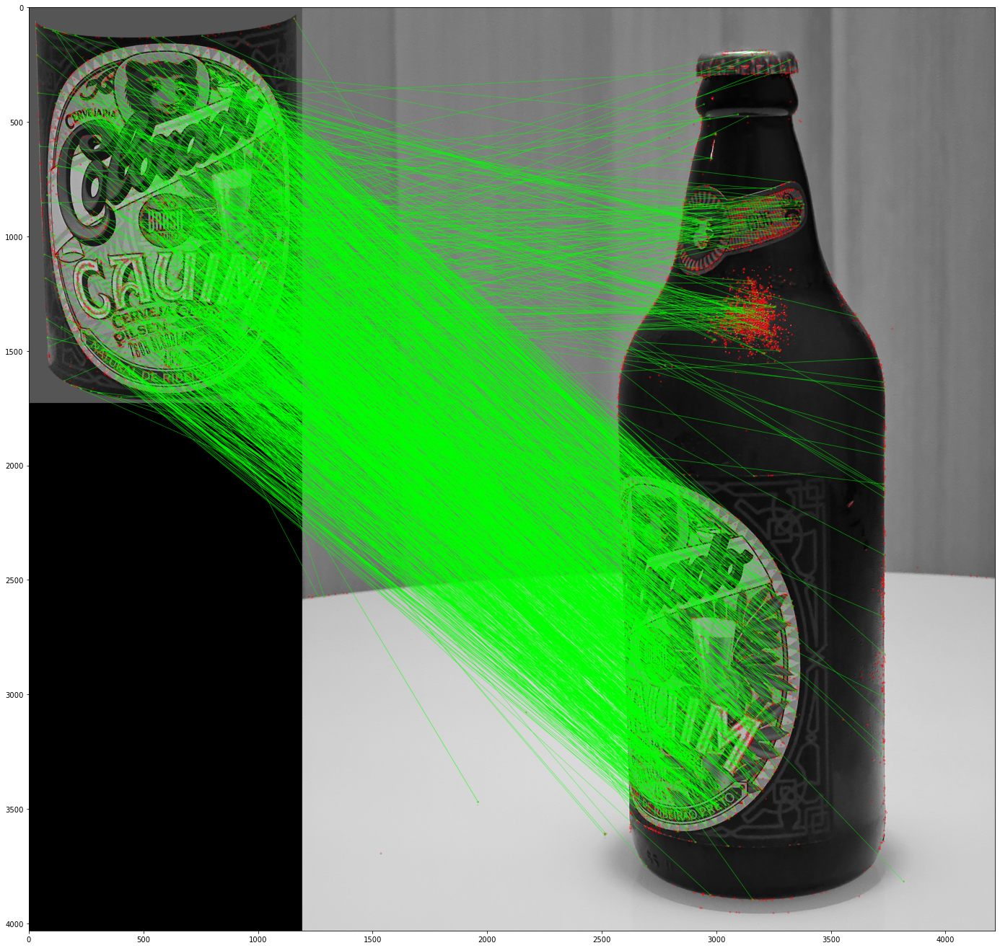

In [3]:
p_TwoSidesCheck = True

#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=p_TwoSidesCheck)

matches = bf.match(descriptors_label, descriptors_scene)
matches_with_cc = sorted(matches, key = lambda x:x.distance)

img_result = cv2.drawMatches(label, keypoints_label, img_scene, keypoints_scene, 
                          matches_with_cc, None, matchColor=(0, 255, 0), matchesMask=None,
                          singlePointColor=(255, 0, 0), flags=0)

plt.figure(figsize=[24,24])
plt.imshow(img_result)

In [4]:
print('Matches Without Crosscheck: ' + str(len(matches_without_cc)))
print('Matches With Crosscheck: ' + str(len(matches_with_cc)))

Matches Without Crosscheck: 6740
Matches With Crosscheck: 1898


#### 2.3 Brute Force with KNN Without Crosscheck

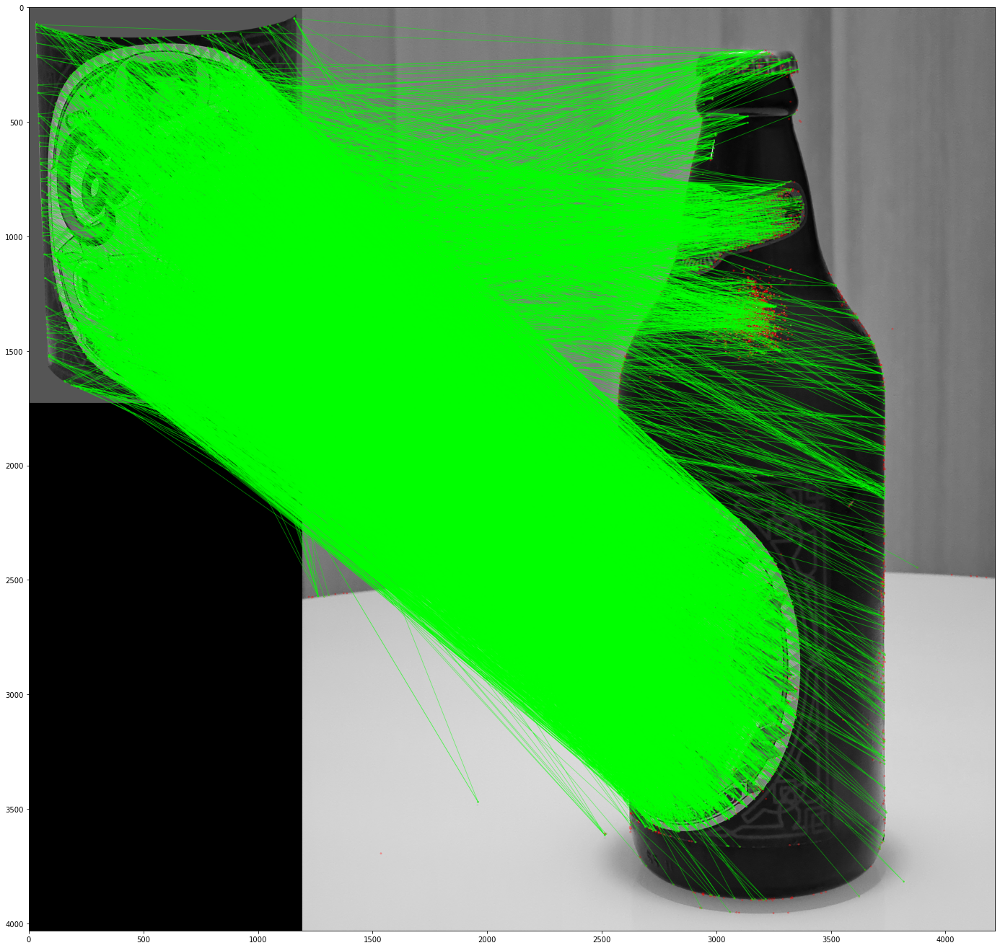

In [5]:
p_TwoSidesCheck = False

#KNN Finds for each descriptor this quantity
p_QuantitiesOfTheBestMatchings = 2

bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=p_TwoSidesCheck)

matches_knn_without_cc = bf.knnMatch(descriptors_label, descriptors_scene, k = p_QuantitiesOfTheBestMatchings)

img_result = cv2.drawMatchesKnn(label, keypoints_label, img_scene, keypoints_scene, 
                          matches_knn_without_cc, None, matchColor=(0, 255, 0), matchesMask=None,
                          singlePointColor=(255, 0, 0), flags=0)

plt.figure(figsize=[24,24])
plt.imshow(img_result)

#### 2.4 Brute Force with KNN Without Crosscheck and Filtering by distance between two best results

Without Good Distance: 6740
With Good Distance: 304


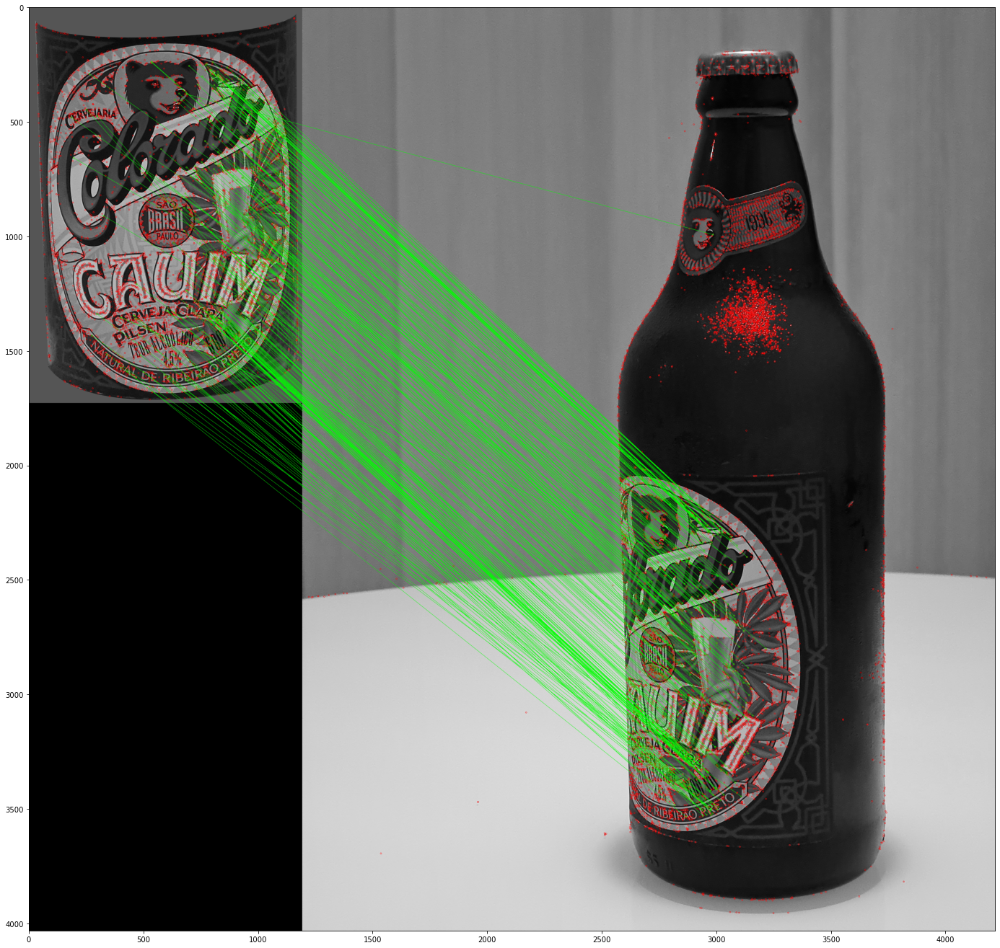

In [6]:
#Attention spected 2 values [m, n]
good_distance = [[m] for m, n in matches_knn_without_cc if m.distance < 0.6*n.distance]

img_result = cv2.drawMatchesKnn(label, keypoints_label, img_scene, keypoints_scene, 
                                good_distance, None, matchColor=(0, 255, 0), matchesMask=None,
                                singlePointColor=(255, 0, 0), flags=0)

plt.figure(figsize=[24,24])
plt.imshow(img_result)

print("Without Good Distance: " + str(len(matches_knn_without_cc)))
print("With Good Distance: " + str(len(good_distance)))

#### 2.5 Brute Force with KNN With Crosscheck

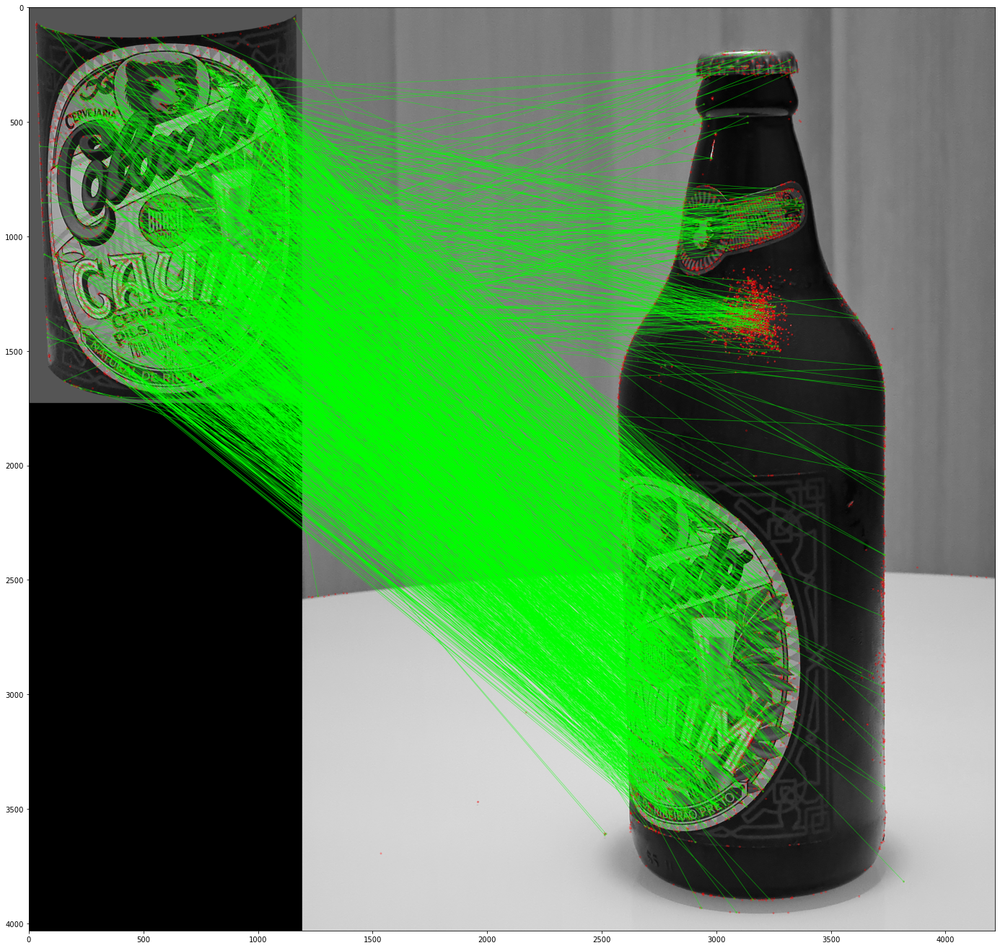

In [7]:
p_TwoSidesCheck = True

#With Crosscheck only one match is considered
p_QuantitiesOfTheBestMatchings = 1

matcher = cv2.BFMatcher(crossCheck = p_TwoSidesCheck)
matches_knn_with_cc = matcher.knnMatch(descriptors_label, descriptors_scene, k = p_QuantitiesOfTheBestMatchings)

img_result = cv2.drawMatchesKnn(label, keypoints_label, img_scene, keypoints_scene, 
                                matches_knn_with_cc, None, matchColor=(0, 255, 0), matchesMask=None,
                                singlePointColor=(255, 0, 0), flags=0)

plt.figure(figsize=[24,24])
plt.imshow(img_result)

#### 2.6 Brute Force with KNN With Crosscheck and Filtering by distance with max distance ratio

In [ ]:
matches_not_null = [x for x in matches_knn_with_cc if x != []]
max_distance = max([m[0].distance for m in matches_not_null])

matches_knn_with_cc_filtered = [x for x in matches_not_null if x[0].distance < 0.6*max_distance] 

img_result = cv2.drawMatchesKnn(label, keypoints_label, img_scene, keypoints_scene, 
                          matches_knn_with_cc_filtered, None, matchColor=(0, 255, 0), matchesMask=None,
                          singlePointColor=(255, 0, 0), flags=0)

plt.figure(figsize=[24,24])
plt.imshow(img_result)

print("Without Good Distance: " + str(len(matches_not_null)))
print("With Good Distance: " + str(len(matches_knn_with_cc_filtered)))

#### 2.7 Brute Force With KNN and Filtered by Lowe's ratio test

Quantity of good matches: 533


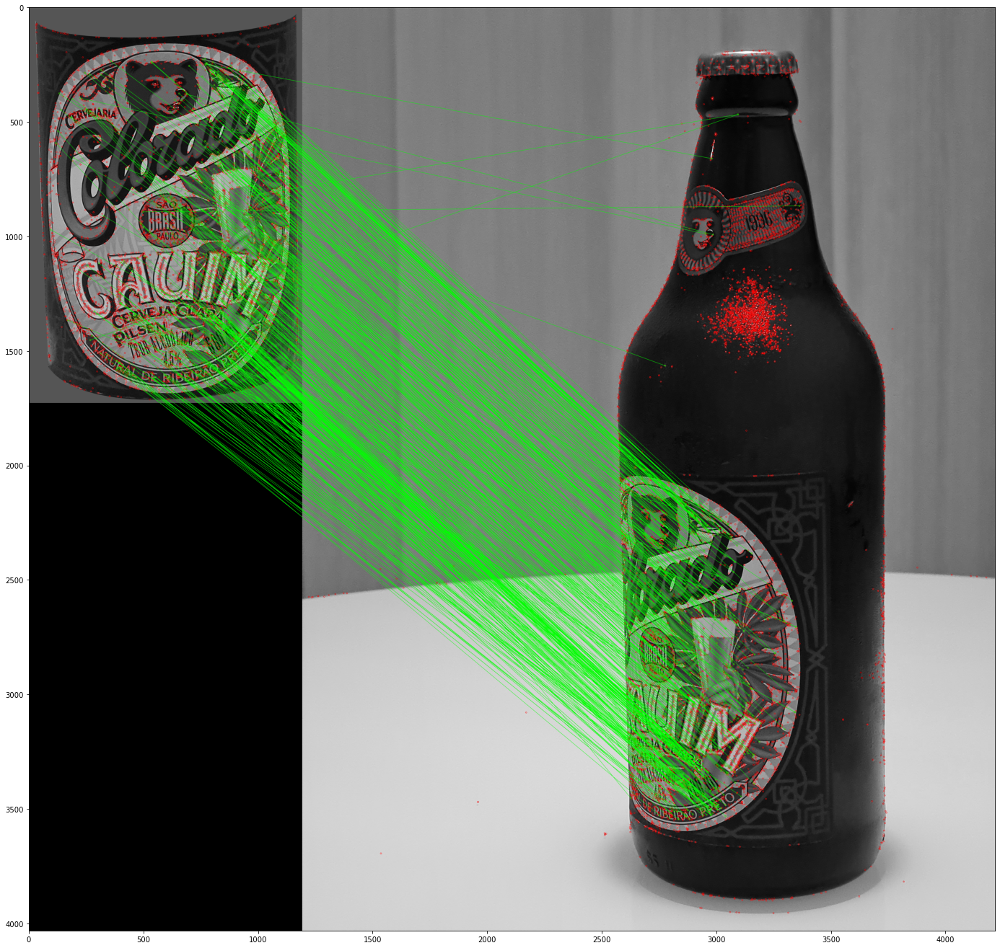

In [43]:
p_TwoSidesCheck = False
p_QuantitiesOfTheBestMatchings = 2

matcher = cv2.BFMatcher(crossCheck = p_TwoSidesCheck)
matches = matcher.knnMatch(descriptors_label, descriptors_scene, k = p_QuantitiesOfTheBestMatchings)

good_matches = []
for m1, m2 in matches:
    closest_kp_distance = m1.distance
    second_closest_kp_distance = m2.distance
    if closest_kp_distance/second_closest_kp_distance < 0.7:
        good_matches.append(m1)

img_result = cv2.drawMatches(label, keypoints_label, img_scene, keypoints_scene, 
                             good_matches, None, matchColor=(0, 255, 0), matchesMask=None,
                             singlePointColor=(255, 0, 0), flags=0)

plt.figure(figsize=[24,24])
plt.imshow(img_result)

print("Quantity of good matches: " + str(len(good_matches)))

## 3 Identify transformation to indicate inlier points

In [52]:
# Verify with anothers type of matches
matches_to_find = matches_knn_without_cc
matches_to_find = matches_knn_with_cc
matches_to_find = good_matches

if type(matches_to_find[0]) is list:
    matches_to_find_plain = []
    for m in matches_to_find:
        if type(m) is list:
            for n in m:
                matches_to_find_plain.append(n)
            
    matches_to_find = matches_to_find_plain
    
# Get positions of matching keypoints
keypoints_label_pos = np.zeros([len(matches_to_find), 2], dtype=np.float32)
keypoints_scene_pos = np.zeros([len(matches_to_find), 2], dtype=np.float32)

for i, m in enumerate(matches_to_find):
    keypoints_label_pos[i] = keypoints_label[m.queryIdx].pt
    keypoints_scene_pos[i] = keypoints_scene[m.trainIdx].pt
    
# T is the transformation matrix, mask is a boolean array indicating inlier points
T, mask = cv2.findHomography(keypoints_label_pos, keypoints_scene_pos, 
                             cv2.RANSAC, ransacReprojThreshold=3.0) 
matchesMask = mask.ravel().tolist()

### 3.1 Find transformation of rectangle delimiting object

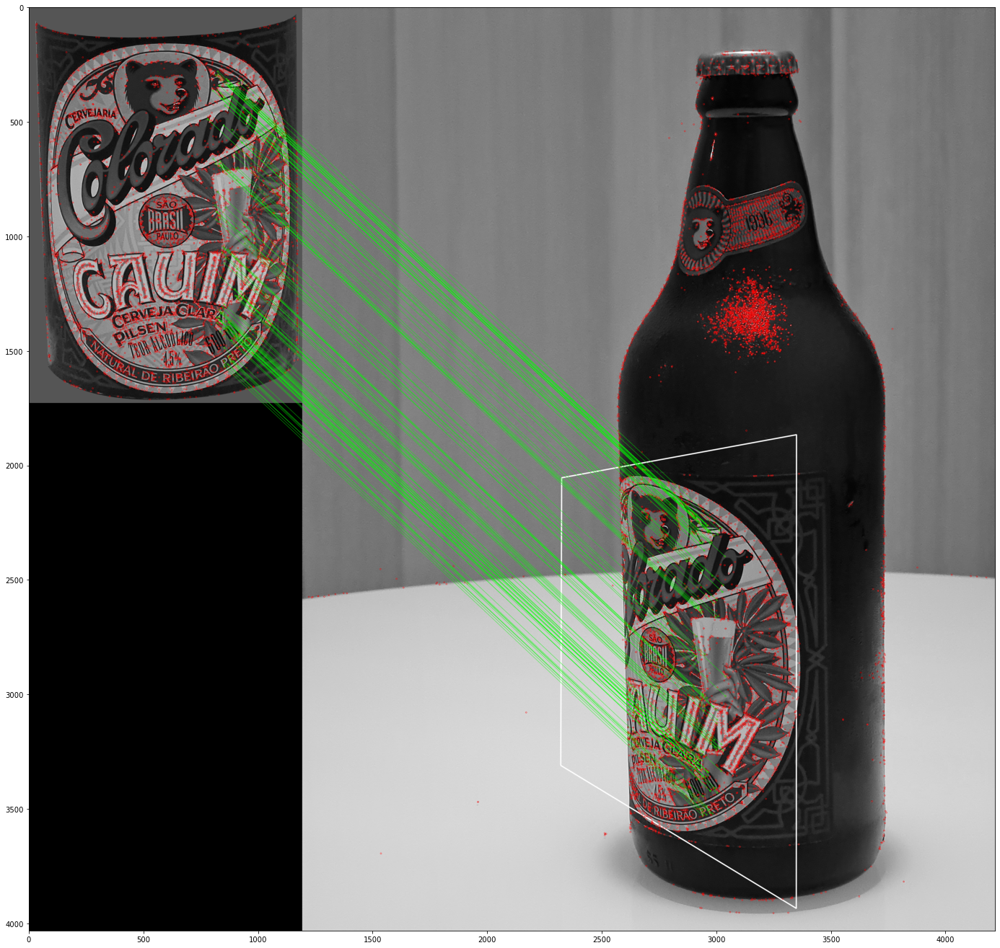

In [54]:
h, w = label.shape
label_bounds = np.float32([[0,0], [0,h-1], [w-1,h-1], [w-1,0] ]).reshape(-1,1,2)
label_bounds_in_scene = cv2.perspectiveTransform(label_bounds, T)

# Draw polygon in the scene
img_scene_box = cv2.polylines(img_scene.copy(), [np.int32(label_bounds_in_scene)], True, 255, 3, cv2.LINE_AA)

img_matches_RANSAC = cv2.drawMatches(label, keypoints_label, img_scene_box, keypoints_scene, 
                                     matches_to_find, None, matchColor=(0, 255, 0), matchesMask=matchesMask,
                                     singlePointColor=(255, 0, 0), flags=0)

plt.figure(figsize=[24,24])
plt.imshow(img_matches_RANSAC, 'gray')